# Webscraping Traditional NBA Pipeline

In [2]:
from selenium import webdriver
from selenium.webdriver.edge.service import Service
from selenium.common.exceptions import WebDriverException
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import Select
from bs4 import BeautifulSoup as bs
from time import sleep
import requests
import pandas as pd
import numpy as np

In [2]:
# Make a url list
url_base = 'https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season='
url_list = []
a = 2021

while a >= 1996:
    b = a+1
    new_url = url_base + str(a) + "-" + str(b)[-2:] + "&SeasonType=Regular%20Season"
    a -=1
    url_list.append(new_url)

In [3]:
url_list[:5]

['https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season=2021-22&SeasonType=Regular%20Season',
 'https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season=2020-21&SeasonType=Regular%20Season',
 'https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season=2019-20&SeasonType=Regular%20Season',
 'https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season=2018-19&SeasonType=Regular%20Season',
 'https://www.nba.com/stats/players/traditional/?PerMode=Totals&sort=PTS&dir=-1&Season=2017-18&SeasonType=Regular%20Season']

In [4]:
dataframe_list = []
n=1 # Make a counter to see how many webpages are scraped

# Scrape stat table for each url in url_list
for url in url_list:
    # Use Selenium, provide path to the Edge driver
    s=Service("C:\\Users\sandr\OneDrive\Desktop\Drivers\msedgedriver.exe")
    driver = webdriver.Edge(service=s)
    
    # Make python pause for some time
    sleep(2)

    # Get the page HTML
    try:
        driver.get(url)
        # Make python pause for some time
        sleep(3)
    except WebDriverException:
        print("Webdriver is acting immediately after ‘closing’ the browser")

    # Use Selenium, click on accept cookies button
    driver.find_element(By.XPATH, "/html/body/div[5]/div[2]/div/div[1]/div/div[2]/div/button").click()

    # Make python pause for some time
    sleep(4)

    # Use Selenium, select table page
    select_page = Select(driver.find_element(By.XPATH,"/html/body/main/div/div/div[2]/div/div/nba-stat-table/div[1]/div/div/select"))
    select_page.select_by_visible_text('All')

    # Use BeautifulSoup and lxml extension to parse, save in variable nba_soup
    nba_soup = bs(driver.page_source, 'lxml')
    
    # Locate the table on the page
    table = nba_soup.find('table')
   
    # Find all the headers in the columns
    headers=[]
    for i in table.find_all('th'):
        title = i.text.replace("\n", "").strip()
        headers.append(title)
    
    # Remove redundant headers
    headers_2 = ['PLAYER','TEAM','AGE','GP','W','L','MIN','PTS','FGM','FGA',
                 'FG%','3PM','3PA','3P%','FTM','FTA','FT%','OREB','DREB', 
                 'REB','AST','TOV','STL','BLK','PF','FP','DD2','TD3','+/-','SEASON']

    # Create a dataframe using the headers as column names
    nba_stat = pd.DataFrame(columns = headers_2) 

    # Create a for loop to fill nba_stat
    for i in table.find_all('tr')[1:]:
        row_data = i.find_all('td')[1:]
        row =[j.text.replace("\n", "") for j in row_data] 
        get_season = url.split('Season=')[1] # get the season year
        get_season = get_season.split('&SeasonType')[0] # get the season year
        row.append(get_season) # add the season to the row column
        length = len(nba_stat)
        nba_stat.loc[length] = row
    
    print("Completed:", n, "webpage(s) scraped.")
    n +=1 # add 1 to counter every successful page retrieved
        
    # Close all browsers
    driver.quit()

    # Append table to list of dataframes
    dataframe_list.append(nba_stat)

Webdriver is acting immediately after ‘closing’ the browser
Completed: 1 webpage(s) scraped.
Completed: 2 webpage(s) scraped.
Completed: 3 webpage(s) scraped.
Completed: 4 webpage(s) scraped.
Completed: 5 webpage(s) scraped.
Completed: 6 webpage(s) scraped.
Completed: 7 webpage(s) scraped.
Completed: 8 webpage(s) scraped.
Webdriver is acting immediately after ‘closing’ the browser
Completed: 9 webpage(s) scraped.
Completed: 10 webpage(s) scraped.
Completed: 11 webpage(s) scraped.
Completed: 12 webpage(s) scraped.
Completed: 13 webpage(s) scraped.
Completed: 14 webpage(s) scraped.
Completed: 15 webpage(s) scraped.
Completed: 16 webpage(s) scraped.
Completed: 17 webpage(s) scraped.
Completed: 18 webpage(s) scraped.
Completed: 19 webpage(s) scraped.
Completed: 20 webpage(s) scraped.
Completed: 21 webpage(s) scraped.
Completed: 22 webpage(s) scraped.
Completed: 23 webpage(s) scraped.
Completed: 24 webpage(s) scraped.
Completed: 25 webpage(s) scraped.
Completed: 26 webpage(s) scraped.


In [5]:
# dataframe_list is a list of all dataframes
dataframe_list

[             PLAYER TEAM AGE  GP   W   L   MIN   PTS              FGM  \
 0        Trae Young  ATL  23  76  40  36  2652  2155              711   
 1     DeMar DeRozan  CHI  32  76  43  33  2743  2118              774   
 2       Joel Embiid  PHI  28  68  45  23  2296  2079              666   
 3      Jayson Tatum  BOS  24  76  49  27  2731  2046              708   
 4      Nikola Jokic  DEN  27  74  46  28  2476  2004              764   
 ..              ...  ...  ..  ..  ..  ..   ...   ...              ...   
 600     Nate Hinton  IND  23   2   0   2     2     0                0   
 601      Sam Dekker  TOR  28   1   1   0     1     0                0   
 602  Trayvon Palmer  DET  27   1   0   1    17     0                0   
 603      Tyler Hall  NYK  25   1   1   0     2     0                0   
 604  Zylan Cheatham  UTA  26   1   0   1     5     0                0   
 
                   FGA  ...              AST              TOV              STL  \
 0                1544  ... 

In [6]:
# Concat all the dataframes into one table
nba_stats = pd.concat(dataframe_list, ignore_index=True)
nba_stats.head()

,PLAYER,TEAM,AGE,GP,W,L,MIN,PTS,FGM,FGA,...,AST,TOV,STL,BLK,PF,FP,DD2,TD3,+/-,SEASON
0,Trae Young,ATL,23,76,40,36,2652,2155,711,1544,...,737,303,72,7,128,3535.3,42,0,159,2021-22
1,DeMar DeRozan,CHI,32,76,43,33,2743,2118,774,1535,...,374,181,68,24,178,3244.4,6,0,77,2021-22
2,Joel Embiid,PHI,28,68,45,23,2296,2079,666,1334,...,284,214,77,99,181,3774.2,46,2,368,2021-22
3,Jayson Tatum,BOS,24,76,49,27,2731,2046,708,1564,...,334,217,75,49,174,3432.8,22,0,667,2021-22
4,Nikola Jokic,DEN,27,74,46,28,2476,2004,764,1311,...,584,281,109,63,191,4337.8,66,19,444,2021-22


# Prepare and Clean Data

In [7]:
# Check datatypes
nba_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12307 entries, 0 to 12306
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   PLAYER  12307 non-null  object
 1   TEAM    12307 non-null  object
 2   AGE     12307 non-null  object
 3   GP      12307 non-null  object
 4   W       12307 non-null  object
 5   L       12307 non-null  object
 6   MIN     12307 non-null  object
 7   PTS     12307 non-null  object
 8   FGM     12307 non-null  object
 9   FGA     12307 non-null  object
 10  FG%     12307 non-null  object
 11  3PM     12307 non-null  object
 12  3PA     12307 non-null  object
 13  3P%     12307 non-null  object
 14  FTM     12307 non-null  object
 15  FTA     12307 non-null  object
 16  FT%     12307 non-null  object
 17  OREB    12307 non-null  object
 18  DREB    12307 non-null  object
 19  REB     12307 non-null  object
 20  AST     12307 non-null  object
 21  TOV     12307 non-null  object
 22  STL     12307 non-null

In [8]:
# Get column names
nba_stats.columns

Index(['PLAYER', 'TEAM', 'AGE', 'GP', 'W', 'L', 'MIN', 'PTS', 'FGM', 'FGA',
       'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB',
       'AST', 'TOV', 'STL', 'BLK', 'PF', 'FP', 'DD2', 'TD3', '+/-', 'SEASON'],
      dtype='object')

In [9]:
# Change datatypes to numeric for appropriate columns
nba_stats[['AGE', 'GP', 'W', 'L', 'MIN', 'PTS', 'FGM', 'FGA',
                 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 
                 'OREB', 'DREB', 'REB','AST', 'TOV', 'STL', 'BLK', 
                 'PF', 'FP', 'DD2', 'TD3', '+/-']] = nba_stats[['AGE', 'GP', 'W', 'L', 'MIN', 'PTS', 
                                                                      'FGM', 'FGA','FG%', '3PM', '3PA', '3P%', 
                                                                      'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB',
                                                                      'AST', 'TOV', 'STL', 'BLK', 'PF', 'FP', 'DD2', 
                                                                      'TD3', '+/-']].apply(pd.to_numeric)

In [10]:
# Verify datatype changes
nba_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12307 entries, 0 to 12306
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PLAYER  12307 non-null  object 
 1   TEAM    12307 non-null  object 
 2   AGE     12307 non-null  int64  
 3   GP      12307 non-null  int64  
 4   W       12307 non-null  int64  
 5   L       12307 non-null  int64  
 6   MIN     12307 non-null  int64  
 7   PTS     12307 non-null  int64  
 8   FGM     12307 non-null  int64  
 9   FGA     12307 non-null  int64  
 10  FG%     12307 non-null  float64
 11  3PM     12307 non-null  int64  
 12  3PA     12307 non-null  int64  
 13  3P%     12307 non-null  float64
 14  FTM     12307 non-null  int64  
 15  FTA     12307 non-null  int64  
 16  FT%     12307 non-null  float64
 17  OREB    12307 non-null  int64  
 18  DREB    12307 non-null  int64  
 19  REB     12307 non-null  int64  
 20  AST     12307 non-null  int64  
 21  TOV     12307 non-null  int64  
 22

In [11]:
# Look at dimension
nba_stats.shape

(12307, 30)

In [12]:
# Find duplicate rows, if any
duplicateRows = nba_stats[nba_stats.duplicated()]
duplicateRows

,PLAYER,TEAM,AGE,GP,W,L,MIN,PTS,FGM,FGA,...,AST,TOV,STL,BLK,PF,FP,DD2,TD3,+/-,SEASON


There are no duplicate rows

In [32]:
# Find null values, if any
null_counts = nba_stats.isnull().sum()
null_counts

PLAYER    0
AGE       0
GP        0
W         0
L         0
MIN       0
PTS       0
FGM       0
FGA       0
FG%       0
3PM       0
3PA       0
3P%       0
FTM       0
FTA       0
FT%       0
OREB      0
DREB      0
REB       0
AST       0
TOV       0
STL       0
BLK       0
PF        0
DD2       0
TD3       0
+/-       0
SEASON    0
dtype: int64

In [13]:
# Remove TEAM and FP (Fantasy Points) columns - irrelevant for this project
nba_stats2 = nba_stats.drop(['TEAM','FP'], axis=1)

nba_stats2.head()

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON
0,Trae Young,23,76,40,36,2652,2155,711,1544,46.0,...,284,737,303,72,7,128,42,0,159,2021-22
1,DeMar DeRozan,32,76,43,33,2743,2118,774,1535,50.4,...,392,374,181,68,24,178,6,0,77,2021-22
2,Joel Embiid,28,68,45,23,2296,2079,666,1334,49.9,...,796,284,214,77,99,181,46,2,368,2021-22
3,Jayson Tatum,24,76,49,27,2731,2046,708,1564,45.3,...,609,334,217,75,49,174,22,0,667,2021-22
4,Nikola Jokic,27,74,46,28,2476,2004,764,1311,58.3,...,1019,584,281,109,63,191,66,19,444,2021-22


### Save file

In [17]:
# Save as csv file
nba_stats2.to_csv('nba_stats.csv', encoding='utf-8', index=False)

In [4]:
# Check that it's saved
nba_stats = pd.read_csv('nba_stats.csv', encoding='utf-8')
nba_stats.head()

,PLAYER,AGE,GP,W,L,MIN,PTS,FGM,FGA,FG%,...,REB,AST,TOV,STL,BLK,PF,DD2,TD3,+/-,SEASON
0,Trae Young,23,76,40,36,2652,2155,711,1544,46.0,...,284,737,303,72,7,128,42,0,159,2021-22
1,DeMar DeRozan,32,76,43,33,2743,2118,774,1535,50.4,...,392,374,181,68,24,178,6,0,77,2021-22
2,Joel Embiid,28,68,45,23,2296,2079,666,1334,49.9,...,796,284,214,77,99,181,46,2,368,2021-22
3,Jayson Tatum,24,76,49,27,2731,2046,708,1564,45.3,...,609,334,217,75,49,174,22,0,667,2021-22
4,Nikola Jokic,27,74,46,28,2476,2004,764,1311,58.3,...,1019,584,281,109,63,191,66,19,444,2021-22


## Exploratory Data Analysis

In [5]:
new_nba = nba_stats.drop(columns=['FGM', 'FGA', 'FTM', 'FTA', 'OREB', 'DREB', '3PM', '3PA'])

In [6]:
# Pairplot
import matplotlib.pyplot as plt
import seaborn as sns
sns.set
%matplotlib inline

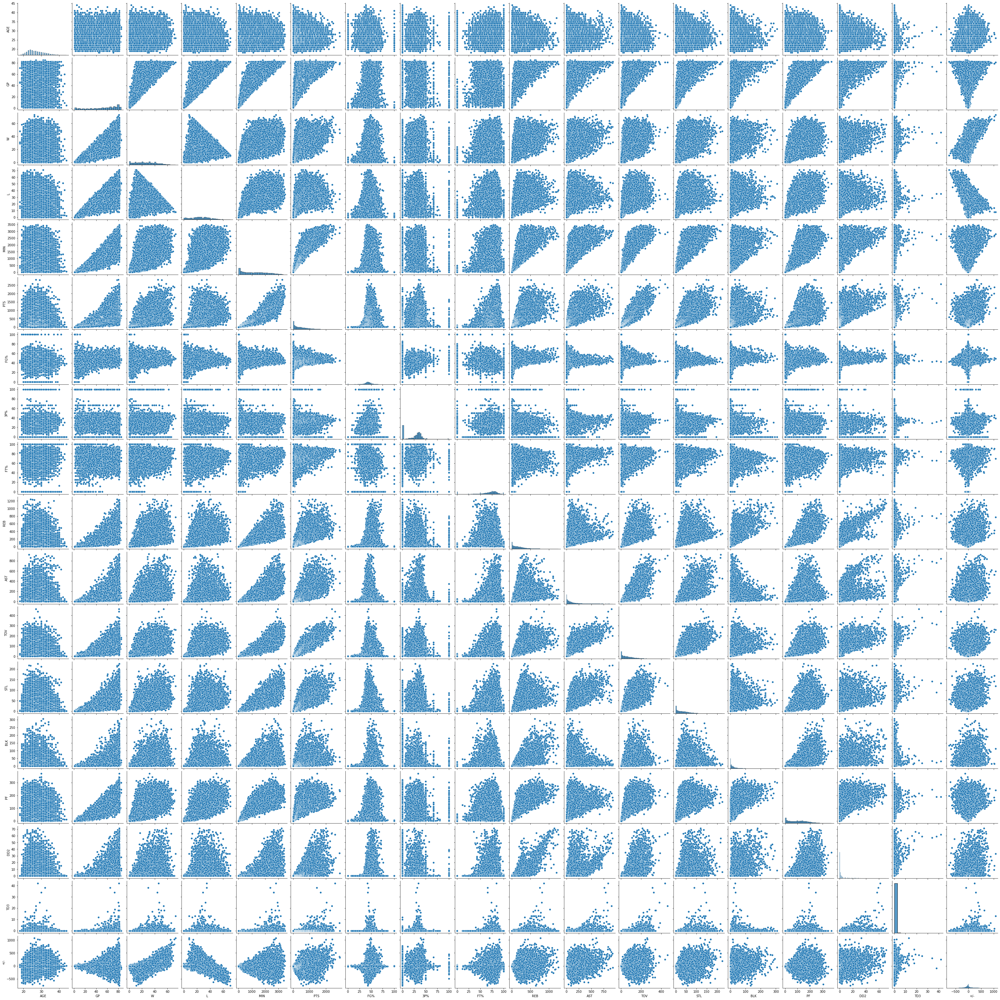

In [7]:
sns.pairplot(new_nba)

<AxesSubplot:>

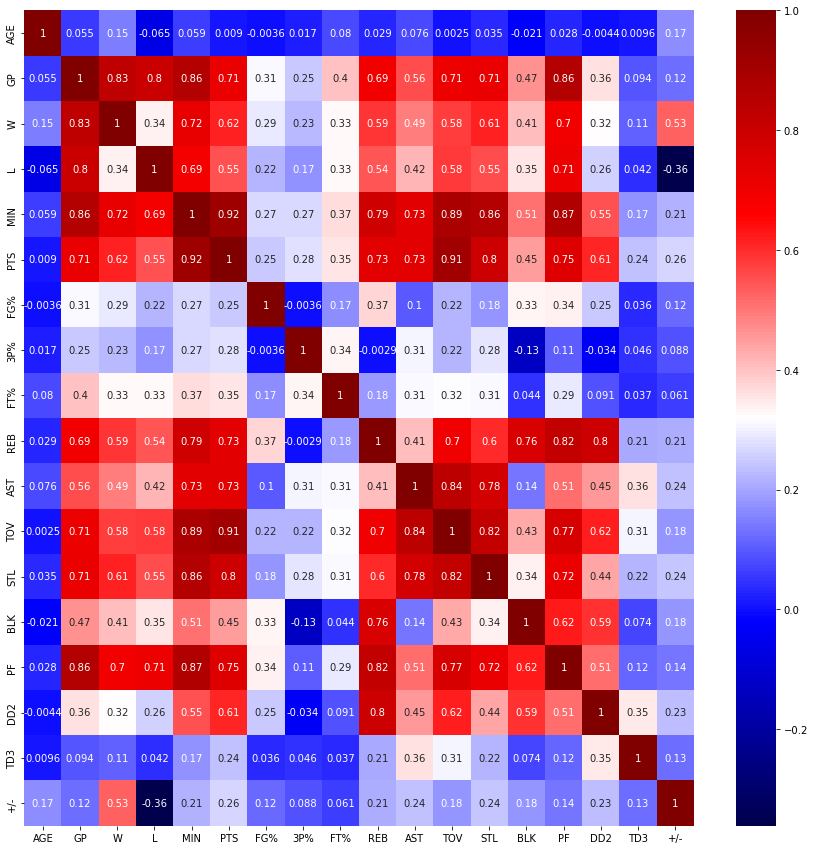

In [8]:
# Use heatmap
fig, ax = plt.subplots(figsize=(15,15))


sns.heatmap(new_nba.corr(), cmap='seismic', annot=True)

In [12]:
# Preliminary OLS statsmodels
import statsmodels.api as sm

y = new_nba['PTS']
X = new_nba.drop(columns=['PTS', 'PLAYER', 'SEASON'])
X = sm.add_constant(X)

model = sm.OLS(y, X)
fit =  model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PTS   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     9077.
Date:                Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                        16:12:17   Log-Likelihood:                -77375.
No. Observations:               12307   AIC:                         1.548e+05
Df Residuals:                   12290   BIC:                         1.549e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.1538      9.865     -1.131      0.258     -30.490       8.182
AGE           -2.7186      0.282     -9.648      0.000      -3.271      -2.166
GP            -1.2274      0.078    -15.763      0.000      -1.380      -1.075
W             -1.1950      0.110    -10.907      0.000      -1.410      -0.980
L             -0.0324      0.125     -0.260      0.795      -0.276       0.212
MIN            0.4851      0.005     88.383      0.000       0.474       0.496
FG%            1.2260      0.129      9.481      0.000       0.973       1.480
3P%            0.8292      0.078     10.641      0.000       0.676       0.982
FT%            0.6885      0.068     10.122      0.000       0.555       0.822
REB           -0.3729      0.023    -16.022      0.000      -0.418      -0.327
AST           -0.9677      0.024    -39.706      0.000      -1.015      -0.920
TOV            4.1557      0.058     71.116      0.000       4.041       4.270
STL           -0.5791      0.076     -7.660      0.000      -0.727      -0.431
BLK           -0.4842      0.059     -8.206      0.000      -0.600      -0.369
PF            -1.1973      0.045    -26.495      0.000      -1.286      -1.109
DD2            7.0411      0.305     23.077      0.000       6.443       7.639
TD3            8.2303      1.344      6.125      0.000       5.596      10.864
+/-            0.2727      0.012     22.570      0.000       0.249       0.296
==============================================================================
Omnibus:                     2010.922   Durbin-Watson:                   1.341
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13132.858
Skew:                           0.622   Prob(JB):                         0.00
Kurtosis:                       7.905   Cond. No.                     1.15e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.19e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [13]:
y = new_nba['PTS']
X = new_nba.drop(columns=['PTS', 'PLAYER', 'SEASON', 'L'])
X = sm.add_constant(X)

model = sm.OLS(y, X)
fit =  model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PTS   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     9077.
Date:                Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                        16:12:38   Log-Likelihood:                -77375.
No. Observations:               12307   AIC:                         1.548e+05
Df Residuals:                   12290   BIC:                         1.549e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.1538      9.865     -1.131      0.258     -30.490       8.182
AGE           -2.7186      0.282     -9.648      0.000      -3.271      -2.166
GP            -1.2598      0.176     -7.139      0.000      -1.606      -0.914
W             -1.1627      0.221     -5.254      0.000      -1.596      -0.729
MIN            0.4851      0.005     88.383      0.000       0.474       0.496
FG%            1.2260      0.129      9.481      0.000       0.973       1.480
3P%            0.8292      0.078     10.641      0.000       0.676       0.982
FT%            0.6885      0.068     10.122      0.000       0.555       0.822
REB           -0.3729      0.023    -16.022      0.000      -0.418      -0.327
AST           -0.9677      0.024    -39.706      0.000      -1.015      -0.920
TOV            4.1557      0.058     71.116      0.000       4.041       4.270
STL           -0.5791      0.076     -7.660      0.000      -0.727      -0.431
BLK           -0.4842      0.059     -8.206      0.000      -0.600      -0.369
PF            -1.1973      0.045    -26.495      0.000      -1.286      -1.109
DD2            7.0411      0.305     23.077      0.000       6.443       7.639
TD3            8.2303      1.344      6.125      0.000       5.596      10.864
+/-            0.2727      0.012     22.570      0.000       0.249       0.296
==============================================================================
Omnibus:                     2010.922   Durbin-Watson:                   1.341
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13132.858
Skew:                           0.622   Prob(JB):                         0.00
Kurtosis:                       7.905   Cond. No.                     1.29e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [14]:
# Assign target and features
y = new_nba['PTS']
X = new_nba.drop(columns=['PTS', 'PLAYER', 'SEASON'])

# Partition into train, val, test into (60, 20, 20 divide)
from sklearn.model_selection import train_test_split

X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)

In [15]:
# Fit a simple linear regression
from sklearn.linear_model import LinearRegression
import numpy as np

lr = LinearRegression()
model = lr.fit(X_train, y_train)

# Score on train set
r_sq = model.score(X_train, y_train)

print('r_squared is = ', np.round(r_sq, 3))

r_squared is =  0.921


In [16]:
# Score on validation set
r_sq_val = model.score(X_val, y_val)
print('r_squared_val is ', np.round(r_sq_val, 3))


r_squared_val is  0.923


## Regularization

In [18]:
# Standardize the scale for data for regularized regression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, RidgeCV

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply the same scaler to the val set
X_val_scaled = scaler.transform(X_val)

In [21]:
# Fit a LASSO model
lasso = LassoCV()
lasso.fit(X_train_scaled, y_train)
print(lasso.score(X_train_scaled, y_train))

# Score on validation set
print(lasso.score(X_val_scaled, y_val))

0.9211201691863637
0.9222661827608365


In [23]:
list(zip(X_train.columns, lasso.coef_))

[('AGE', -12.502097191267952),
 ('GP', -29.2910447986671),
 ('W', -16.38615117200967),
 ('L', -0.0),
 ('MIN', 405.50993597070647),
 ('FG%', 10.129427524038299),
 ('3P%', 16.466236062589143),
 ('FT%', 13.980825597217041),
 ('REB', -60.32758126847665),
 ('AST', -115.61022371325942),
 ('TOV', 259.05965270321997),
 ('STL', -21.857518998935017),
 ('BLK', -14.121345068386306),
 ('PF', -82.95479359701778),
 ('DD2', 60.459065687959715),
 ('TD3', 6.455298152519893),
 ('+/-', 43.62311234170737)]

In [22]:
# Fit a Ridge model
ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train)
print(ridge.score(X_train_scaled, y_train))

# Score on validation set
print(ridge.score(X_val_scaled, y_val))

0.9212288386654329
0.9225170275471379


In [24]:
list(zip(X_train.columns, ridge.coef_))

[('AGE', -12.559160548782529),
 ('GP', -18.87761563085951),
 ('W', -24.55440804126556),
 ('L', -5.321067039803893),
 ('MIN', 418.8356345813954),
 ('FG%', 11.281889251342363),
 ('3P%', 16.143535267503466),
 ('FT%', 13.959677614569955),
 ('REB', -72.27939712049556),
 ('AST', -124.78367609083944),
 ('TOV', 263.55061411295173),
 ('STL', -24.1819379175613),
 ('BLK', -14.581394649052527),
 ('PF', -85.11346455678722),
 ('DD2', 65.9272031136934),
 ('TD3', 7.691134849534137),
 ('+/-', 45.61834285200166)]

**Refitting Lasso with fewer variables**

In [26]:
# Assign target and features
y = new_nba['PTS']
X2 = new_nba.drop(columns=['PTS', 'PLAYER', 'SEASON', 'L'])

# Partition into train, val, test into (60, 20, 20 divide)
from sklearn.model_selection import train_test_split

X2, X2_test, y, y_test = train_test_split(X2, y, test_size=0.2, random_state=0)

X2_train, X2_val, y_train, y_val = train_test_split(X2, y, test_size=0.25, random_state=0)



In [27]:
# Standardize the scale
scaler = StandardScaler()
X2_train_scaled = scaler.fit_transform(X2_train)

# Apply the same scaler to the val set
X2_val_scaled = scaler.transform(X2_val)



In [28]:
# Fit a Lasso model
lasso2 = LassoCV()
lasso2.fit(X2_train_scaled, y_train)
print(lasso2.score(X2_train_scaled, y_train))

# Score on validation set
print(lasso2.score(X2_val_scaled, y_val))

0.921119869848143
0.9222651498456345


In [29]:
list(zip(X_train.columns, lasso2.coef_))

[('AGE', -12.50152037117308),
 ('GP', -29.292127706693623),
 ('W', -16.383915938255925),
 ('L', 405.47086840287363),
 ('MIN', 10.12762782571515),
 ('FG%', 16.468499547891827),
 ('3P%', 13.981454362346998),
 ('FT%', -60.312960509913225),
 ('REB', -115.60467542559965),
 ('AST', 259.07012673708607),
 ('TOV', -21.84955128345462),
 ('STL', -14.120951649647818),
 ('BLK', -82.94573201128733),
 ('PF', 60.4528547890754),
 ('DD2', 6.452846543261367),
 ('TD3', 43.622617519191735)]

## Let's look at a subset of variables only

In [31]:
subset_nba = new_nba[['PTS', 'DD2', 'PF', 'BLK', 'STL',
                      'TOV', 'AST', 'REB', 'FT%', 'MIN', 
                      'L', 'W', 'GP']]

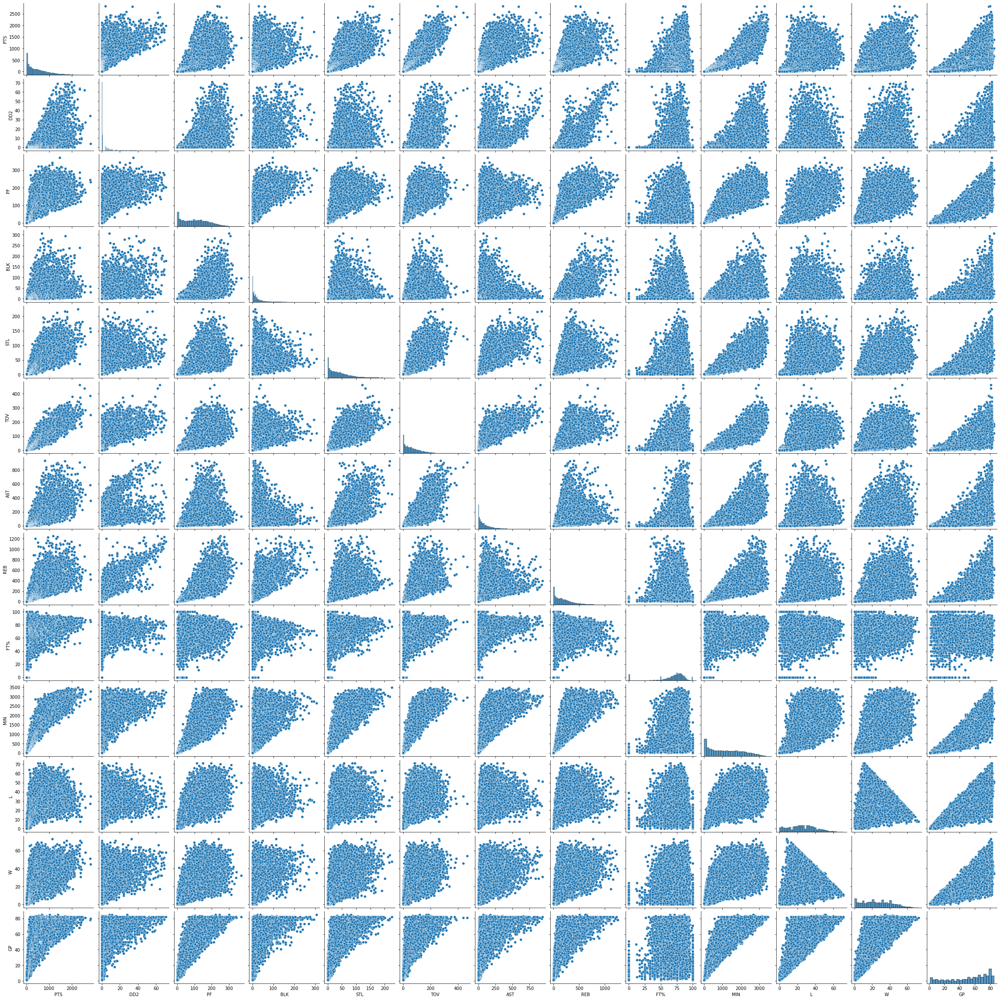

In [32]:
sns.pairplot(subset_nba)

<AxesSubplot:>

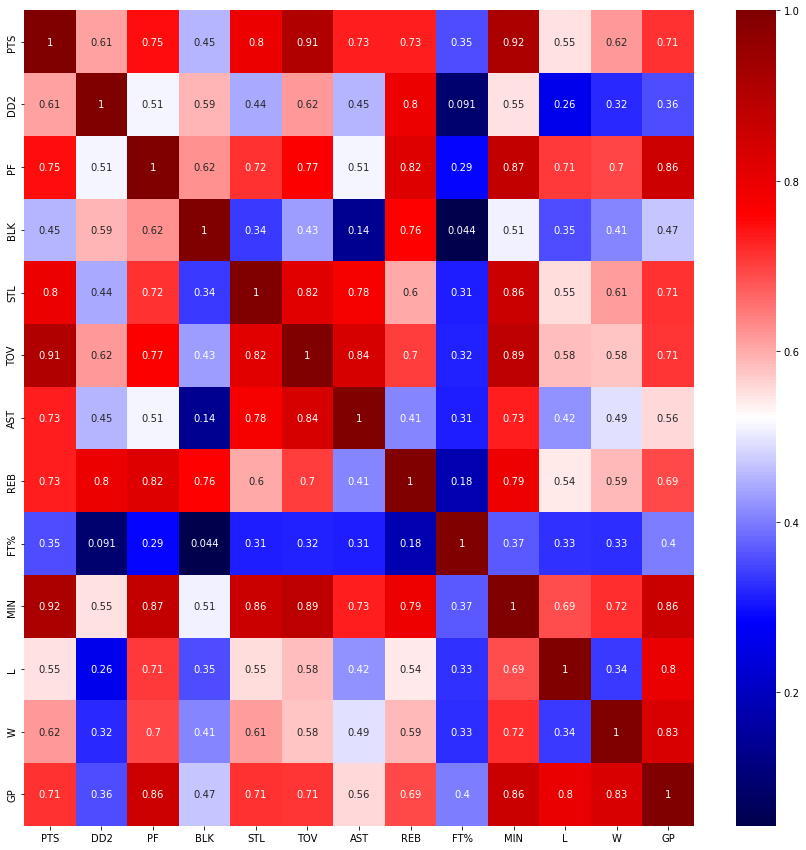

In [33]:
# Use heatmap
fig, ax = plt.subplots(figsize=(15,15))


sns.heatmap(subset_nba.corr(), cmap='seismic', annot=True)

In [35]:
# Check for multicollinearity with VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor

variables = subset_nba[['PTS', 'DD2', 'PF', 'BLK', 'STL',
                      'TOV', 'AST', 'REB', 'FT%', 'MIN', 
                      'L', 'W', 'GP']]
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif['features'] = variables.columns

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


In [36]:
vif

,VIF,features
0,25.588513,PTS
1,7.121006,DD2
2,25.223343,PF
3,4.191728,BLK
4,10.734632,STL
5,28.410651,TOV
6,12.904083,AST
7,31.048404,REB
8,6.742109,FT%
9,72.820587,MIN


In [38]:
# Check for multicollinearity with VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor

variables = subset_nba[['PTS', 'DD2', 'PF', 'BLK', 'STL',
                      'TOV', 'AST', 'REB', 'FT%', 'MIN', 
                      'W', 'GP']]
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif['features'] = variables.columns

In [39]:
vif

,VIF,features
0,25.588513,PTS
1,7.121006,DD2
2,25.223343,PF
3,4.191728,BLK
4,10.734632,STL
5,28.410651,TOV
6,12.904083,AST
7,31.048404,REB
8,6.742109,FT%
9,72.820587,MIN


In [37]:
y = subset_nba['PTS']
X = subset_nba.drop(columns=['PTS', 'L'])
X = sm.add_constant(X)

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    PTS   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                 1.224e+04
Date:                Sun, 31 Jul 2022   Prob (F-statistic):               0.00
Time:                        16:49:08   Log-Likelihood:                -77807.
No. Observations:               12307   AIC:                         1.556e+05
Df Residuals:                   12295   BIC:                         1.557e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -36.6669      4.714     -7.779      0.000     -45.906     -27.427
DD2            7.4491      0.314     23.733      0.000       6.834       8.064
PF            -1.2518      0.046    -26.994      0.000      -1.343      -1.161
BLK           -0.3742      0.060     -6.197      0.000      -0.493      -0.256
STL           -0.3354      0.078     -4.324      0.000      -0.487      -0.183
TOV            4.0691      0.059     68.795      0.000       3.953       4.185
AST           -0.8932      0.024    -36.889      0.000      -0.941      -0.846
REB           -0.3473      0.023    -14.874      0.000      -0.393      -0.302
FT%            0.9406      0.068     13.758      0.000       0.807       1.075
MIN            0.4913      0.005     91.413      0.000       0.481       0.502
W              2.6797      0.141     18.998      0.000       2.403       2.956
GP            -3.4606      0.141    -24.501      0.000      -3.737      -3.184
==============================================================================
Omnibus:                     2125.699   Durbin-Watson:                   1.303
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13226.493
Skew:                           0.684   Prob(JB):                         0.00
Kurtosis:                       7.891   Cond. No.                     5.97e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.97e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [48]:
# Assign target and features
y = subset_nba['PTS']
X = subset_nba.drop(columns=['PTS', 'L'])

# Partition into train, test into (80, 20 divide)
from sklearn.model_selection import cross_val_score, train_test_split, KFold

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Split training data into multiple folds
kf = KFold(n_splits=5,
             shuffle=True,
             random_state=3)

# Fit a simple linear regression
lr = LinearRegression()
lr_scores = cross_val_score(lr, X_train, y_train, cv=kf)

print(lr_scores)
print("Linear Regression Mean Score: ", np.mean(lr_scores))

[0.91721743 0.90897048 0.91657466 0.92100353 0.91422936]
Linear Regression Mean Score:  0.9155990931483977


## Evaluate the Model

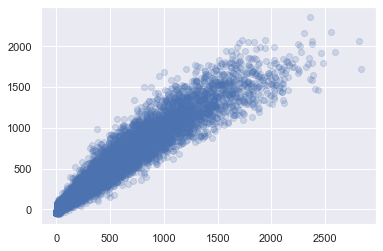

In [51]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
%matplotlib inline

# Fitted vs Actual
fit = lr.fit(X_train, y_train)

y_train_pred = lr.predict(X_train)

plt.scatter(y_train, y_train_pred, alpha=0.2)
plt.plot([0, 400], [0, 400])

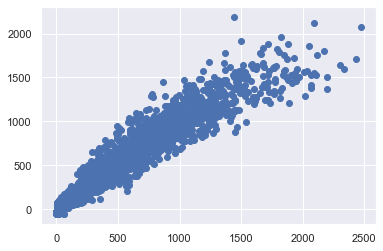

In [52]:
# Fitted vs Actual
y_test_pred = lr.predict(X_test)

plt.scatter(y_test, y_test_pred)
plt.plot([0, 400], [0, 400])

Text(0.5, 1.0, 'Residuals vs Predictions')

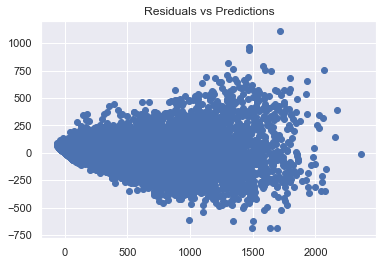

In [53]:
# Plot Residuals vs Predicted

lr_resid = y_train - y_train_pred

plt.scatter(y_train_pred, lr_resid)
plt.plot([0,400], [0,0])
plt.title("Residuals vs Predictions")

In [ ]:
['DD2', 'PF', 'BLK', 'STL',
                      'TOV', 'AST', 'REB', 'FT%', 'MIN', 
                      'W', 'GP'

In [58]:
x_test = [12, 130, 23, 85, 206, 404, 335, 92.3, 2211, 45, 64]


predictions = lr.predict(x_test)
predictions

C:\Users\sandr\anaconda3\envs\metis\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


ValueError: Expected 2D array, got 1D array instead:
array=[  12.   130.    23.    85.   206.   404.   335.    92.3 2211.    45.
   64. ].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.